# <a href="https://mipt-stats.gitlab.io/courses/ad_fivt.html">Введение в анализ данных</a>
## Домашнее задание 6. Линейная регрессия.


**Правила, <font color="red">прочитайте внимательно</font>:**

* Выполненную работу нужно отправить телеграм-боту `@miptstats_ds22_bot`. Для начала работы с ботом каждый раз отправляйте `/start`. **Работы, присланные иным способом, не принимаются.**
* Дедлайн см. в боте. После дедлайна работы не принимаются кроме случаев наличия уважительной причины.
* Прислать нужно **ноутбук в формате `ipynb`**.
* Следите за размером файлов. **Бот не может принимать файлы весом более 20 Мб.** Если файл получается больше, заранее разделите его на несколько.
* Выполнять задание необходимо полностью самостоятельно. **При обнаружении списывания все участники списывания будут сдавать устный зачет.**
* Решения, размещенные на каких-либо интернет-ресурсах, не принимаются. Кроме того, публикация решения в открытом доступе может быть приравнена к предоставлении возможности списать.
* Для выполнения задания используйте этот ноутбук в качестве основы, ничего не удаляя из него. Можно добавлять необходимое количество ячеек.
* Комментарии к решению пишите в markdown-ячейках.
* Выполнение задания (ход решения, выводы и пр.) должно быть осуществлено на русском языке.
* Если код будет не понятен проверяющему, оценка может быть снижена.
* Никакой код из данного задания при проверке запускаться не будет. *Если код студента не выполнен, недописан и т.д., то он не оценивается.*


**Баллы за задание:**

<b><font color="blue">Легкая часть</font></b> (достаточно на "хор"):
* Задача 1 &mdash; 70 баллов

<b><font color="orange">Сложная часть</font></b> (необходимо на "отл"):
* Задача 2 &mdash; 50 баллов


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style='darkgrid', font_scale=1.3, palette='Set2')
%matplotlib inline

При решении задания используйте `sklearn`. Пропишите сюда необходимые импорты

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LinearRegression
from sklearn import metrics

### <font color="blue"><i>Легкая часть</i></font>

---
### Задача 1.

Скоро лето &mdash; идеальное время года для путешествий и прогулок на велосипедах. В крупных городах обычно развиты сети проката велосипедов, предоставляющие удобный сервис. Одной из важных задач таких компаний является прогнозирование количества арендованных велосипедов в зависимости от времени года и погодных условий.

Рассмотрим датасет <a target="_blank" href="https://archive.ics.uci.edu/ml/datasets/Bike+Sharing+Dataset">Bike Sharing Dataset</a> от компании <a target="_blank" href="https://www.capitalbikeshare.com/">Capital Bikeshare</a>, располагающей автоматизированными пунктами проката велосипедов. В датасете по дням записаны календарная информация и погодные условия, а также число прокатов в этот день. Цель &mdash; предсказать количество арендованных велосипедов по остальным характеристикам.



Будем работать только со следующими признаками:
* `season`: время года: 1 &mdash; весна, 2 &mdash; лето, 3 &mdash; осень, 4 &mdash; зима;
* `mnth`: месяц от 1 до 12;
* `holiday`: является ли текущий день праздничным;
* `weekday`: день недели от 0 до 6;
* `workingday`: является ли текущий день рабочим или выходным;
* `weathersit`: оценка благоприятности погоды от 1 (чистый, ясный день) до 4 (ливень, туман);
* `temp`: температура в Цельсиях;
* `atemp`: температура по ощущениям в Цельсиях;
* `hum`: влажность воздуха;
* `windspeed`: скорость ветра;
* `cnt`: количество арендованных велосипедов в текущий день.

Перед выполнением задания обязательно посмотрите <a href="https://mipt-stats.gitlab.io/courses/ad_fivt/linreg_sklearn.html">ноутбук</a> с занятия по линейной регрессии.

---

Скачайте данные, загрузите их с помощью `pandas` и разделите на обучающую и тестовую части в соотношении 4:1. Далее всю аналитику необходимо проводить только на обучающей части данных.

In [ ]:
data = pd.read_csv('./day.csv', parse_dates=[1])
data = data[['season', 'mnth', 'holiday', 'weekday', 'workingday', 'weathersit', 'temp', 'atemp', 'hum', 'windspeed', 'cnt']]

In [ ]:
data

,season,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,cnt
0,1,1,0,6,0,2,0.344167,0.363625,0.805833,0.160446,985
1,1,1,0,0,0,2,0.363478,0.353739,0.696087,0.248539,801
2,1,1,0,1,1,1,0.196364,0.189405,0.437273,0.248309,1349
3,1,1,0,2,1,1,0.200000,0.212122,0.590435,0.160296,1562
4,1,1,0,3,1,1,0.226957,0.229270,0.436957,0.186900,1600
...,...,...,...,...,...,...,...,...,...,...,...
726,1,12,0,4,1,2,0.254167,0.226642,0.652917,0.350133,2114
727,1,12,0,5,1,2,0.253333,0.255046,0.590000,0.155471,3095
728,1,12,0,6,0,2,0.253333,0.242400,0.752917,0.124383,1341
729,1,12,0,0,0,1,0.255833,0.231700,0.483333,0.350754,1796


*Подготовим данные к анализу.*

In [ ]:
data['season'].value_counts()

3    188
2    184
1    181
4    178
Name: season, dtype: int64

In [ ]:
data['mnth'].value_counts()

1     62
3     62
5     62
7     62
8     62
10    62
12    62
4     60
6     60
9     60
11    60
2     57
Name: mnth, dtype: int64

In [ ]:
data['holiday'].value_counts()

0    710
1     21
Name: holiday, dtype: int64

In [ ]:
data[ 'weekday'].value_counts()

6    105
0    105
1    105
2    104
3    104
4    104
5    104
Name: weekday, dtype: int64

In [ ]:
data['workingday'].value_counts()

1    500
0    231
Name: workingday, dtype: int64

In [ ]:
data['weathersit'].value_counts()

1    463
2    247
3     21
Name: weathersit, dtype: int64

In [ ]:
X = data[['season', 'mnth', 'holiday',   'weekday', 'workingday', 'weathersit', 'temp', 'atemp', 'hum', 'windspeed']]
y = data['cnt']
cat_f = data[['mnth', 'holiday',   'weekday']]
train, test = train_test_split(data, train_size=0.8, random_state=42, shuffle=True)

*Т.к. будем учить OneHotEncoder только на train, нужно проследить, чтобы вкатегории категориальных признаков встречались в train хотя бы раз. Поэтому проверим, все ли категории есть в train.*

In [ ]:
len(train['season'].value_counts())

4

In [ ]:
len(train['mnth'].value_counts())

12

In [ ]:
train['holiday'].value_counts()

0    569
1     15
Name: holiday, dtype: int64

In [ ]:
len(train[ 'weekday'].value_counts())

7

In [ ]:
len(train['workingday'].value_counts())

2

In [ ]:
len(train['weathersit'].value_counts())

3

*Weatherset содержит не все категории в трейне. Найдём какую-нибудь строку с недостающим weatherset, добавим ей в трейн и удалим из тестовой выборки.*

In [ ]:
train['weathersit'].value_counts()

1    367
2    199
3     18
Name: weathersit, dtype: int64

In [ ]:
train.query("weathersit == 4")

,season,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,cnt


*Видим, что строк с weatherset, равным 4, в данных нет. Значит, не будем ничего менять.*

In [ ]:
train = train.reset_index()
del train['index']

test = test.reset_index()
del test['index']

#### 1. Визуальный анализ

Посмотрите по графикам, как *целевой признак зависит от остальных* и поймите характер этой зависимости. 

Какие признаки категориальные, а какие &mdash; вещественные? Учтите это при построении информативных графиков.

*Некоторые признаки можно отнести и к категориальным, и к вещественным. Построим графики, приняв все "спорные" признаки сначала за вещественные, а затем - за числовые.*

In [ ]:
categorial_features = ['holiday', 'workingday']
real_features = ['season', 'mnth', 'weekday', 'weathersit', 'temp', 'atemp', 'hum', 'windspeed']
target_feature = ['cnt']

In [ ]:
train_redacted = train.copy()

train_redacted['holiday'] = train_redacted['holiday'].apply(str)
train_redacted['holiday'] = np.where((train_redacted['holiday'] == '0'), "Нет", train_redacted['holiday'])
train_redacted['holiday'] = np.where((train_redacted['holiday'] == '1'), "Да", train_redacted['holiday'])

train_redacted['workingday'] = train_redacted['workingday'].apply(str)
train_redacted['workingday'] = np.where((train_redacted['workingday'] == '0'), "Нет", train_redacted['workingday'])
train_redacted['workingday'] = np.where((train_redacted['workingday'] == '1'), "Да", train_redacted['workingday'])

train_redacted

,season,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,cnt
0,4,11,Нет,2,Да,2,0.343333,0.323225,0.662917,0.342046,4094
1,3,9,Нет,4,Да,3,0.633913,0.555361,0.939565,0.192748,1842
2,4,12,Нет,6,Нет,1,0.299167,0.310604,0.612917,0.095783,3614
3,3,9,Нет,0,Нет,1,0.507500,0.490537,0.695000,0.178483,4274
4,3,6,Нет,3,Да,1,0.697500,0.640792,0.360000,0.271775,7335
...,...,...,...,...,...,...,...,...,...,...,...
579,1,3,Нет,0,Нет,1,0.384348,0.380091,0.527391,0.270604,2417
580,2,4,Нет,0,Нет,1,0.456667,0.445696,0.479583,0.303496,3744
581,4,9,Нет,3,Да,2,0.635000,0.575158,0.848750,0.148629,3907
582,1,3,Нет,0,Нет,1,0.361739,0.359670,0.476957,0.222587,4911


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1213: UserWarning: No contour levels were found within the data range.
  **contour_kws,
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1213: UserWarning: No contour levels were found within the data range.
  **contour_kws,
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1213: UserWarning: No contour levels were found within the data range.
  **contour_kws,
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1213: UserWarning: No contour levels were found within the data range.
  **contour_kws,
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1213: UserWarning: No contour levels were found within the data range.
  **contour_kws,
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1213: UserWarning: No contour levels were found within the data range.
  **contour_kws,
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1213: UserWarning: No co

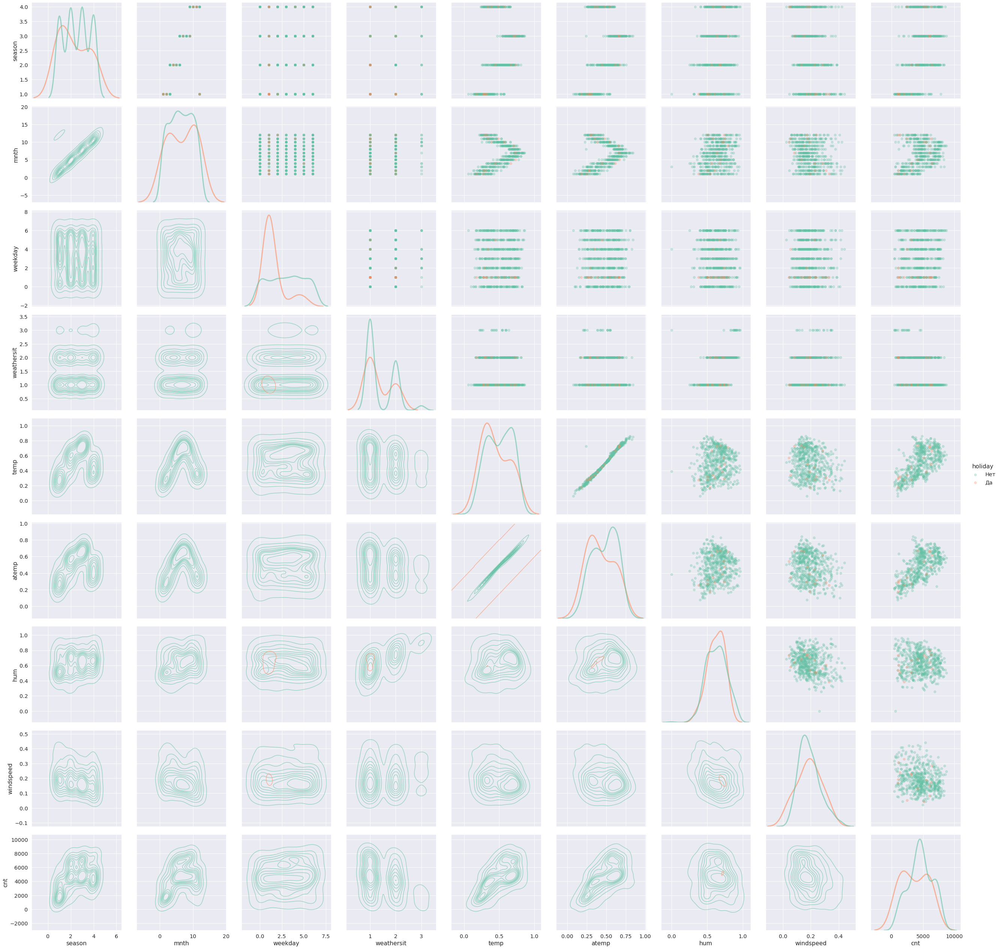

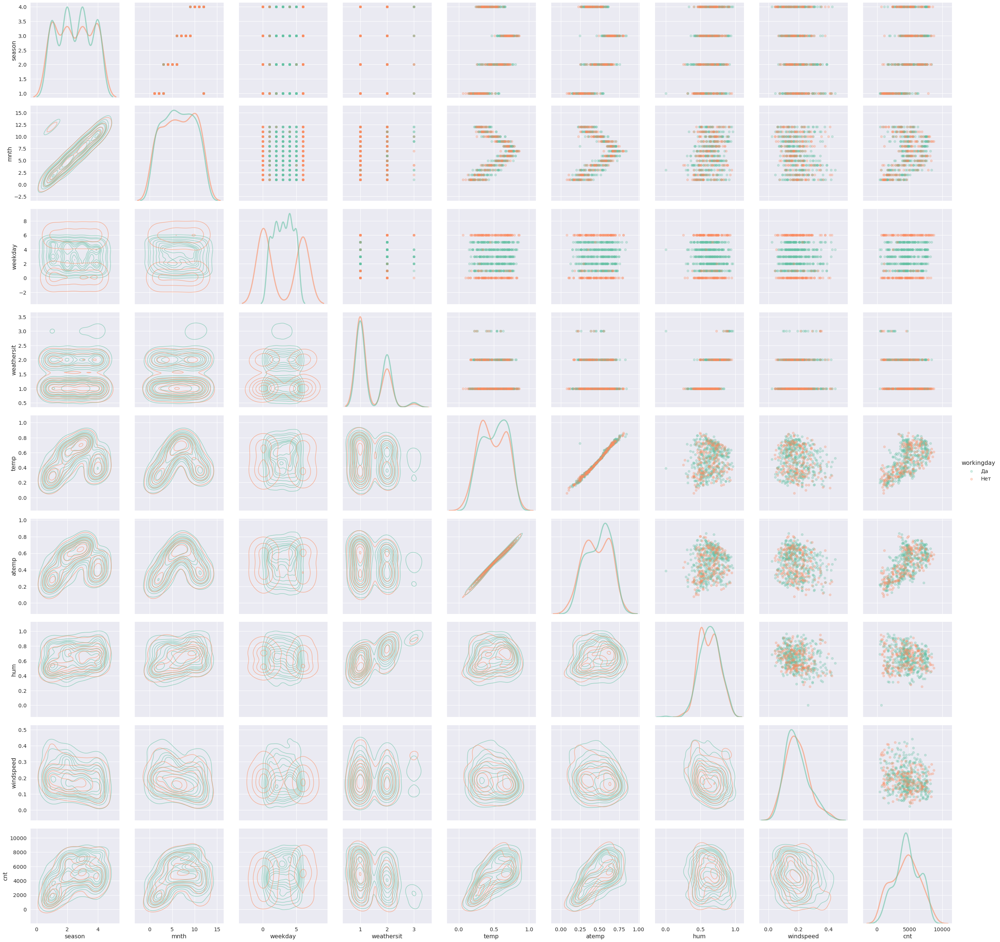

In [ ]:
sns.set(font_scale=1.3, palette='Set2')

for hue in categorial_features:
    g = sns.PairGrid(train_redacted[['season', 'mnth', 'weekday', 'weathersit', 'temp', 
                            'atemp', 'hum', 'windspeed', 'cnt', hue]], hue=hue, diag_sharey=False, height=4)
    g.map_lower(sns.kdeplot, alpha=0.6)
    g.map_upper(plt.scatter, alpha=0.3)
    g.map_diag(sns.kdeplot, lw=3, alpha=0.6, common_norm=False)  
    g.add_legend()

In [ ]:
categorial_features = ['holiday', 'workingday', 'season', 'mnth', 'weekday', 'weathersit']
real_features = ['temp', 'atemp', 'hum', 'windspeed']

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1213: UserWarning: No contour levels were found within the data range.
  **contour_kws,
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1213: UserWarning: No contour levels were found within the data range.
  **contour_kws,
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1213: UserWarning: No contour levels were found within the data range.
  **contour_kws,
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1213: UserWarning: No contour levels were found within the data range.
  **contour_kws,
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1213: UserWarning: No contour levels were found within the data range.
  **contour_kws,
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1213: UserWarning: No contour levels were found within the data range.
  **contour_kws,
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1213: UserWarning: No co

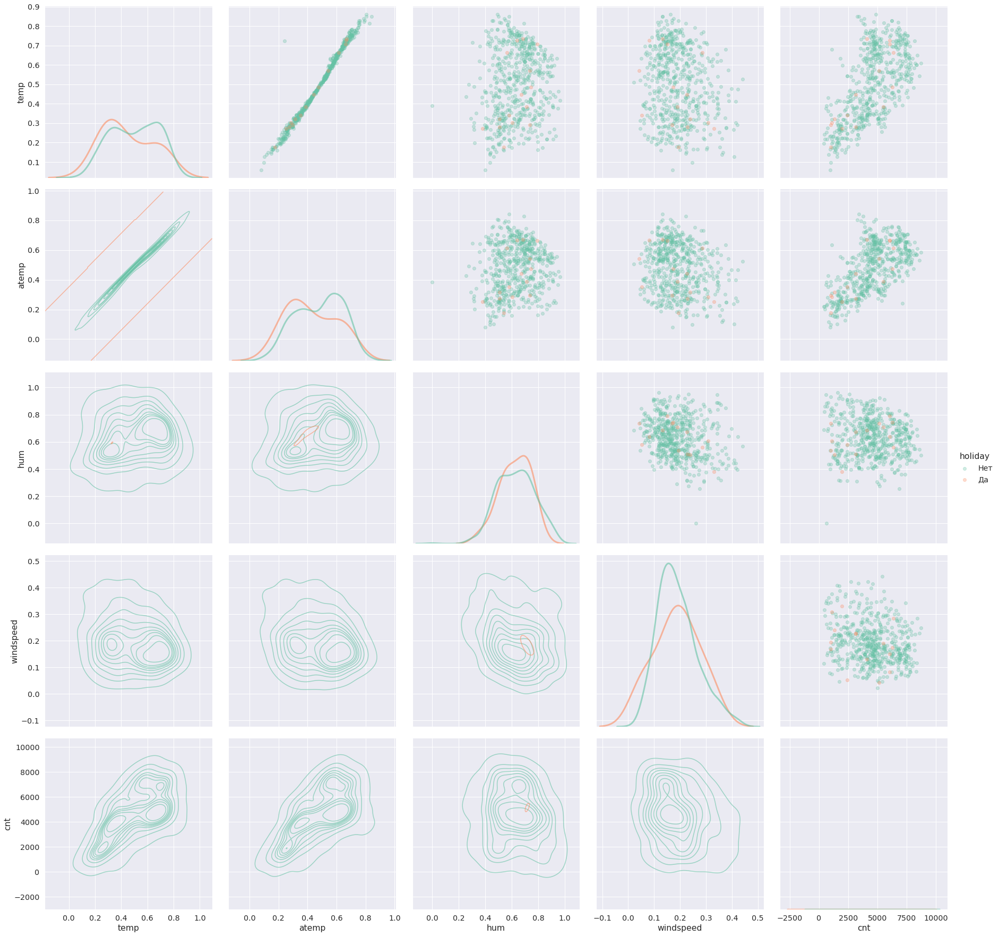

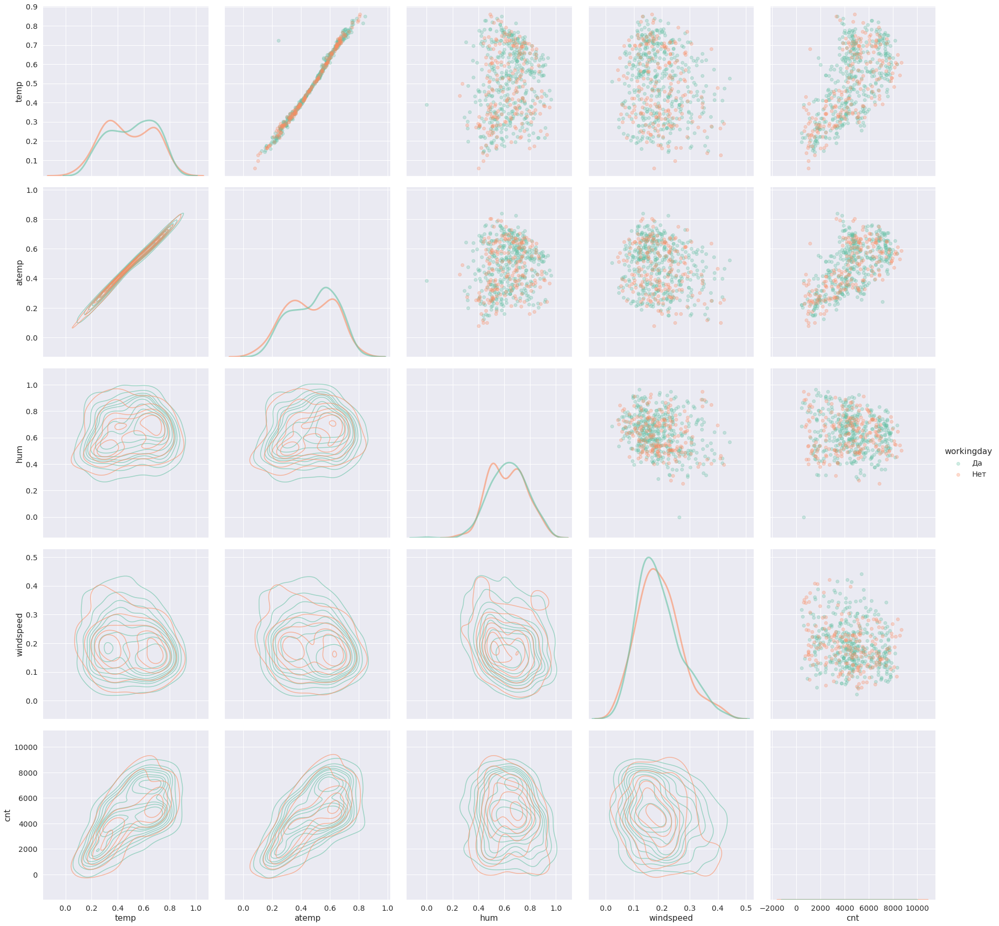

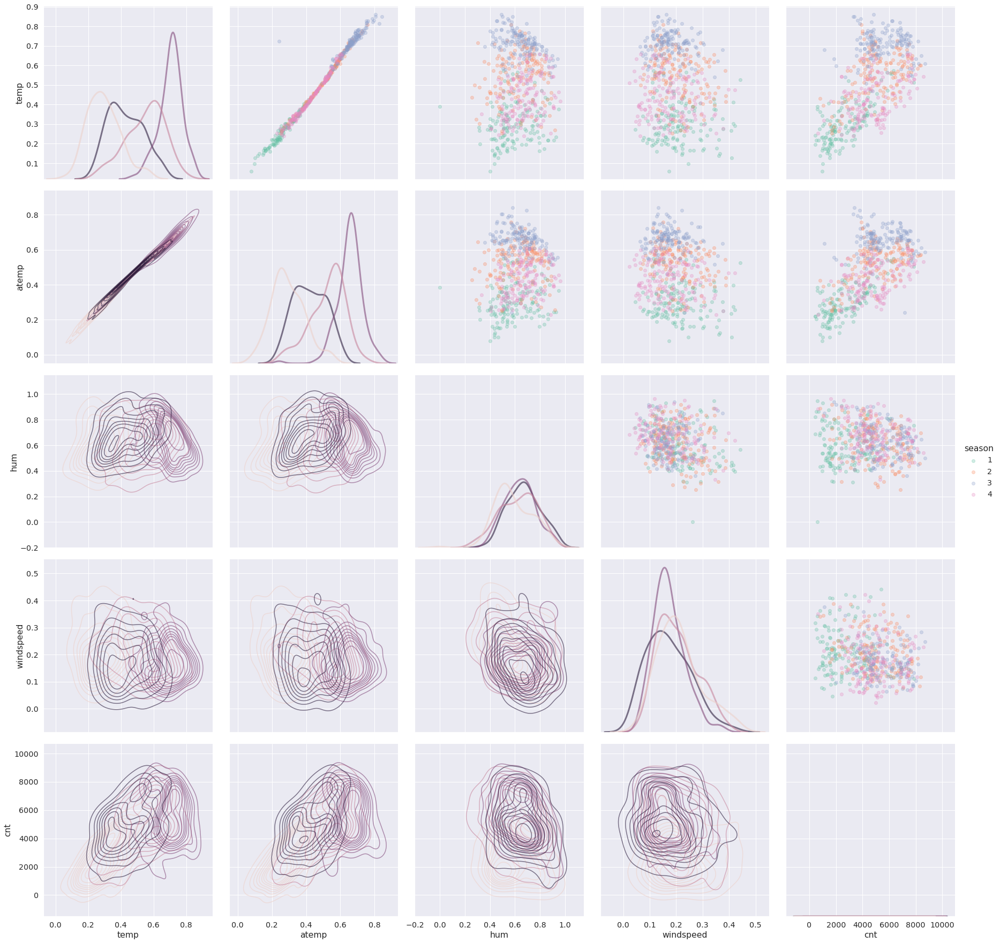

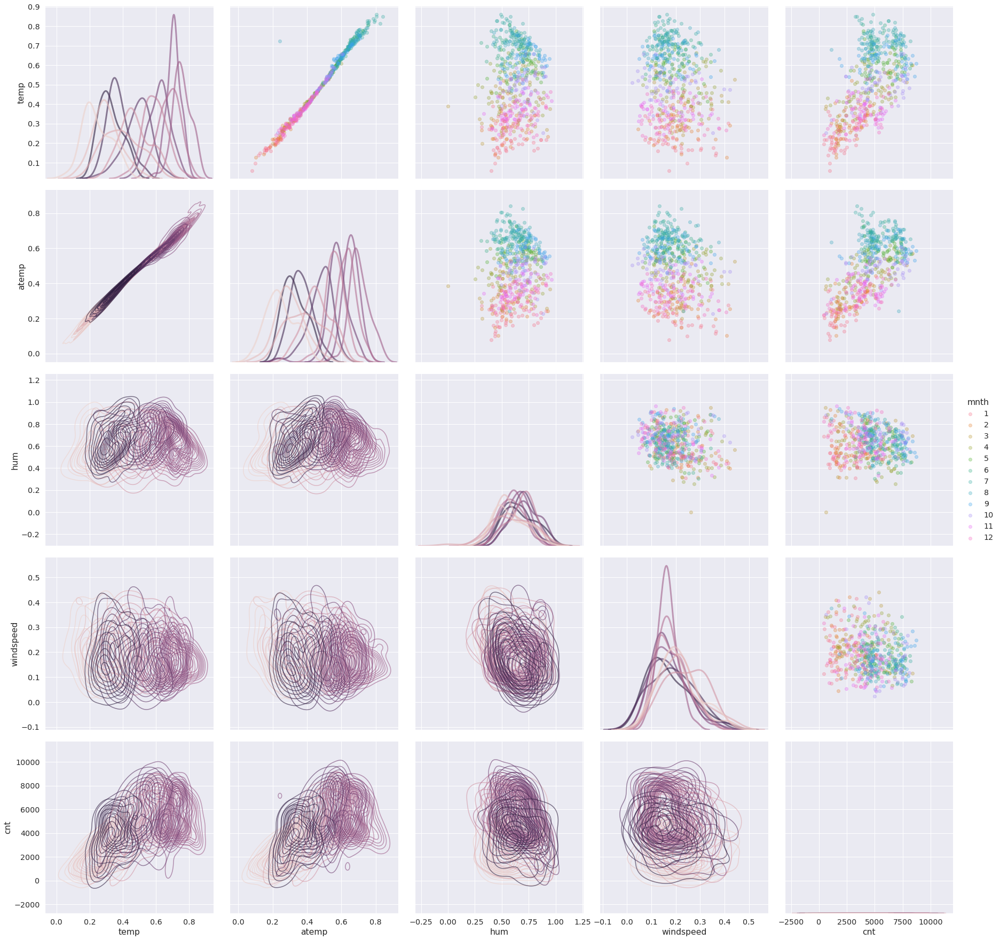

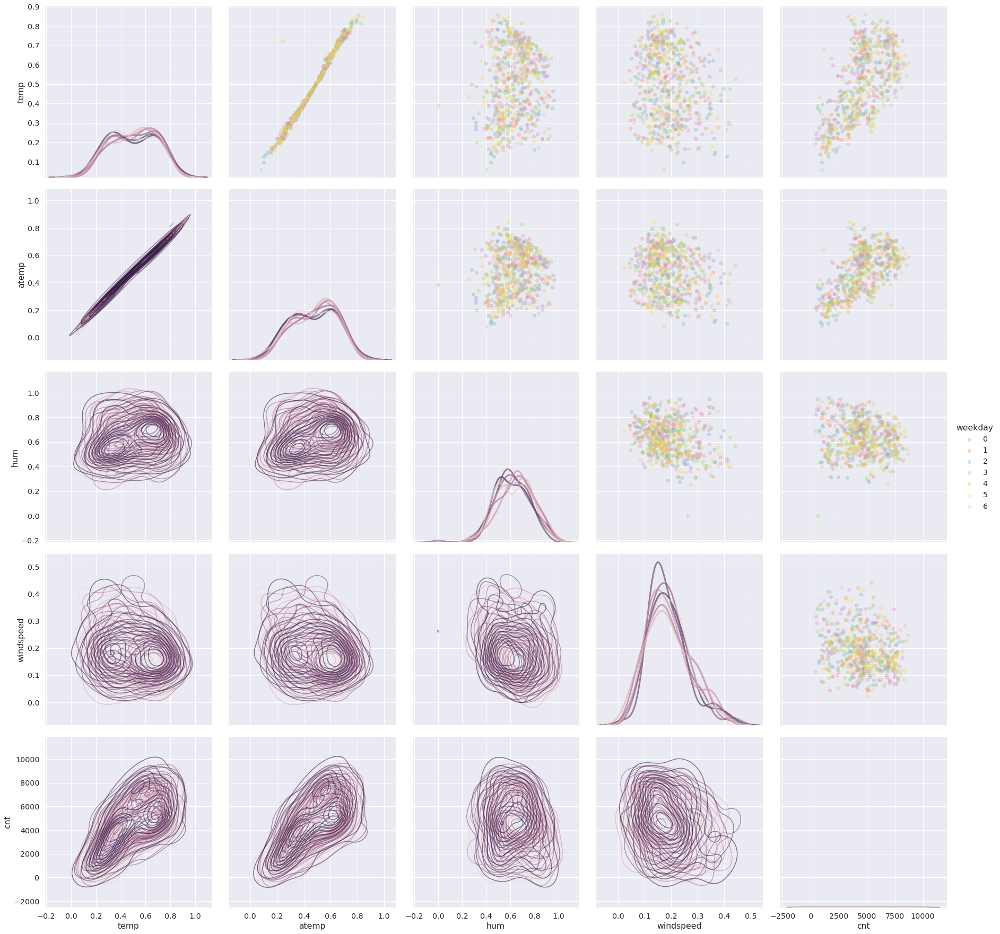

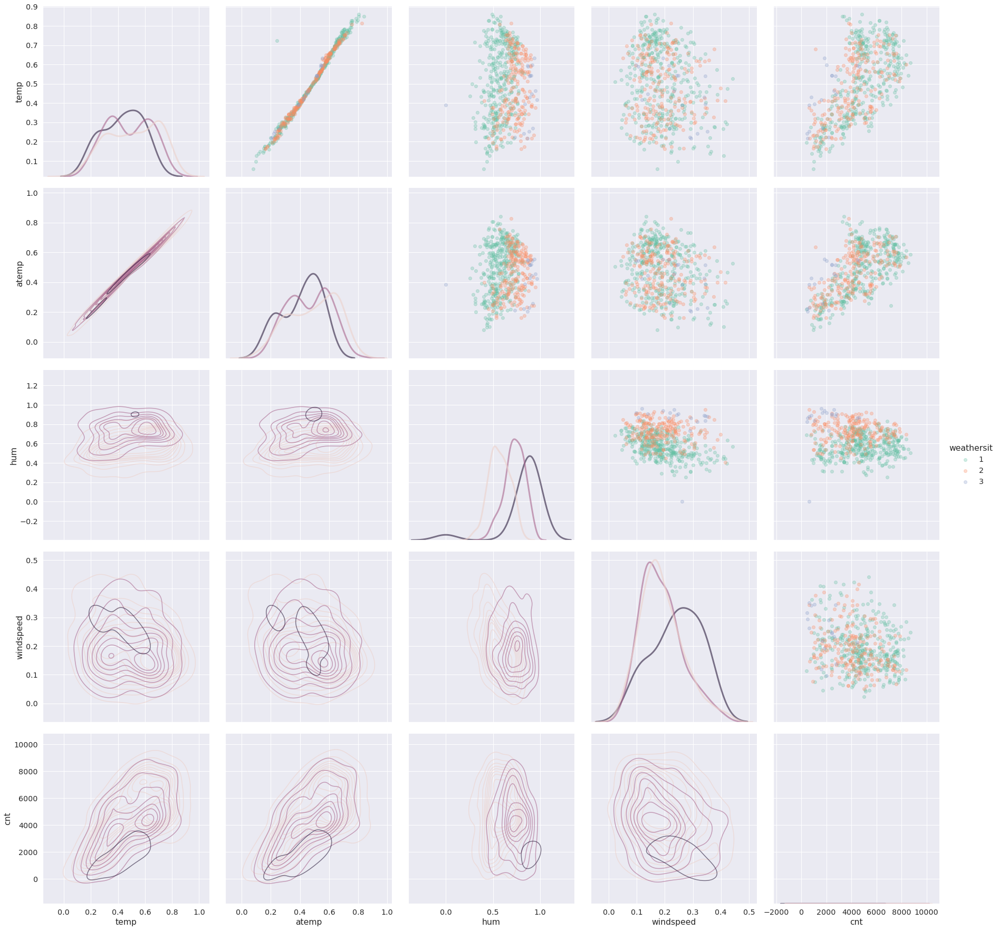

In [ ]:
sns.set(font_scale=1.3, palette='Set2')

for hue in categorial_features:
    g = sns.PairGrid(train_redacted[['temp', 'atemp', 'hum', 'windspeed', 'cnt', hue]], hue=hue, 
                     diag_sharey=True, height=5)
    g.map_lower(sns.kdeplot, alpha=0.6)
    g.map_upper(plt.scatter, alpha=0.3)
    g.map_diag(sns.kdeplot, lw=3, alpha=0.6, common_norm=False)  
    g.add_legend()

*Вторая серия графиков даёт больше информации.*

*Визуализируем зависимость 10-ой степени натурального логарифма количества арендованных за день велосипедов от ощцщаемой температуры воздуха в этот день.*

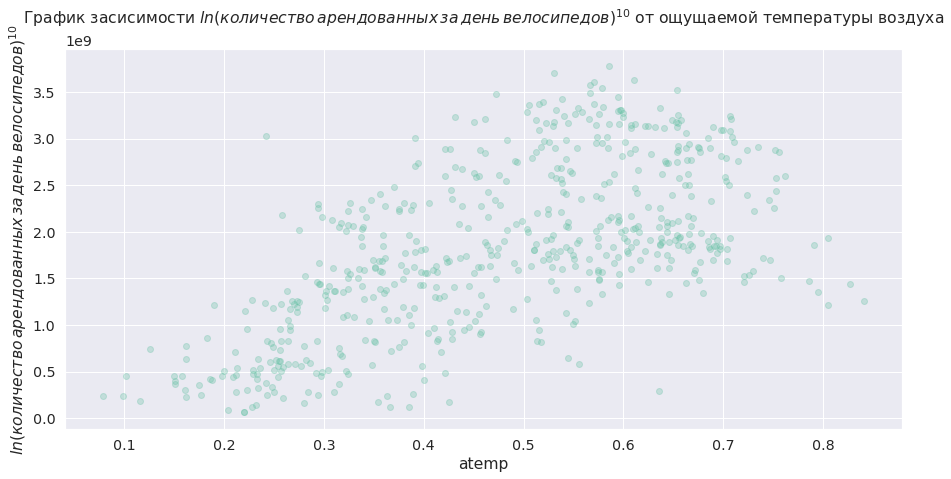

In [ ]:
plt.figure(figsize=(15, 7))
plt.scatter(train_redacted['atemp'], train_redacted['cnt'].apply(lambda x: np.log(x)**10), alpha=0.3)
plt.title("График засисимости $ln(количество \, арендованных \, за \,  день \, велосипедов)^{10}$ от ощущаемой температуры воздуха", y=1.05)
plt.xlabel("atemp")
plt.ylabel("$ln(количество \, арендованных \, за \,  день \, велосипедов)^{10}$")
plt.show()

*Также визуализируем зависимость количества арендованных велосипедов по месяцам, а также медиану и среднее по дням каждого месяца.*

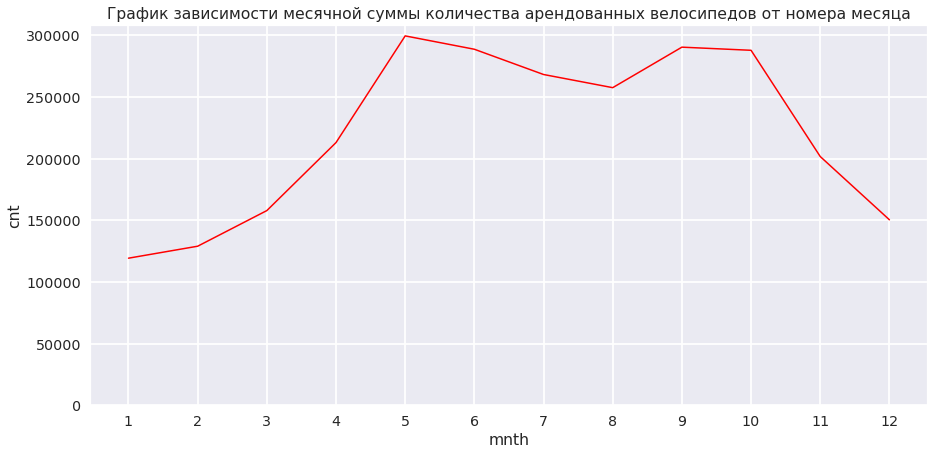

In [ ]:
plt.figure(figsize=(15, 7))
plt.plot(np.arange(1, 13), train_redacted.groupby('mnth').sum()['cnt'], color='red', label='сумма')
plt.title("График зависимости месячной суммы количества арендованных велосипедов от номера месяца")
plt.ylim(0,)
plt.grid(which='major', color = 'white', linewidth = 2, alpha=0.9)
plt.xticks(np.arange(1, 13))
plt.xlabel("mnth")
plt.ylabel("cnt")
plt.show()

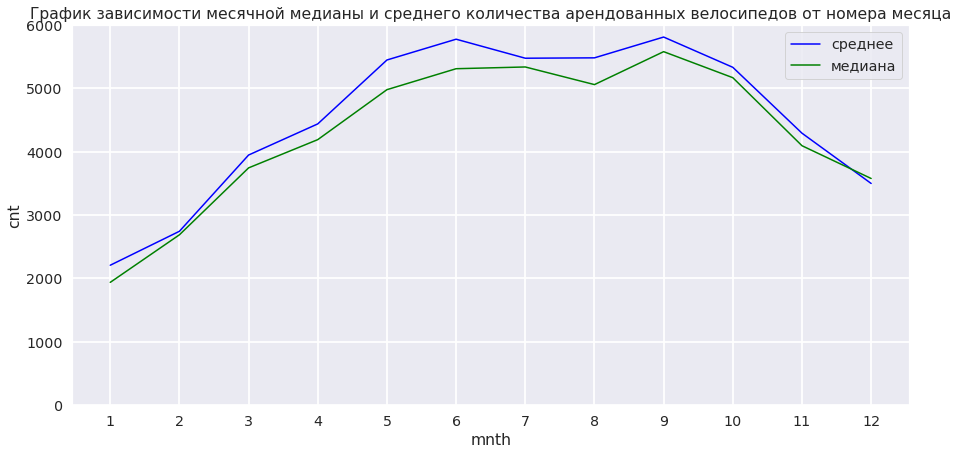

In [ ]:
plt.figure(figsize=(15, 7))
plt.plot(np.arange(1, 13), train_redacted.groupby('mnth').mean()['cnt'], color='blue', label='среднее')
plt.plot(np.arange(1, 13), train_redacted.groupby('mnth').median()['cnt'], color='green', label='медиана')
plt.title("График зависимости месячной медианы и среднего количества арендованных велосипедов от номера месяца")
plt.ylim(0,)
plt.legend()
plt.grid(which='major', color = 'white', linewidth = 2, alpha=0.9)
plt.xticks(np.arange(1, 13))
plt.xlabel("mnth")
plt.ylabel("cnt")
plt.show()

*Видим заметную зависимость суммарного количества, среднего и медианы количества арендованных велосипедов от номера месяца. Наибольшей популярностью аренда велосипедов пользуется в 5-10 месяцах.*

Сделайте выводы по графикам. В частности, ответьте на следующие вопросы.
* Есть ли в данных явные выбросы, то есть точки, далеко находящиеся от основной массы точек?
* Стоит ли рассматривать какие-либо нелинейные функции от признаков? Не стоит придумывать сложные функции, достаточно рассмотреть $x^2$, $\log x$ и $I\{x > c\}$.



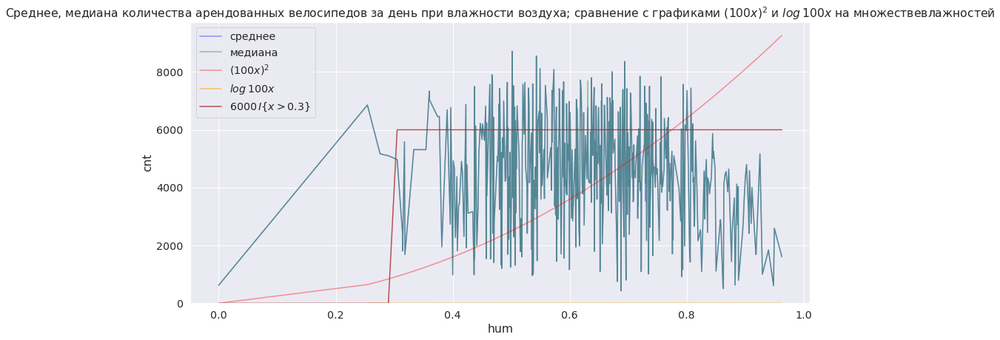

In [ ]:
def indicator(x, c = 0.5):
  if x > c:
    return 1
  else:
    return 0

plt.figure(figsize=(15, 7))
plt.plot(train_redacted.groupby('hum').mean().index, train_redacted.groupby('hum').mean()['cnt'], color='blue', label='среднее', alpha=0.4)
plt.plot(train_redacted.groupby('hum').median().index, train_redacted.groupby('hum').median()['cnt'], color='green', label='медиана', alpha=0.4)
plt.plot(train_redacted.groupby('hum').mean().index, pd.Series(train_redacted.groupby('hum').mean().index).apply(lambda x: (100 * x)**2), color='red', label='$(100x)^2$', alpha=0.4)
plt.plot(train_redacted.groupby('hum').mean().index, pd.Series(train_redacted.groupby('hum').mean().index).apply(lambda x: np.log(100 * x)), color='orange', label='$log \, 100x$', alpha=0.6)
plt.plot(train_redacted.groupby('hum').mean().index, pd.Series(train_redacted.groupby('hum').mean().index).apply(lambda x: 6000*indicator(x, 0.3)), color='brown', label='$ 6000 \,I \{ x > 0.3 \} $', alpha=0.8)

plt.title("Среднее, медиана количества арендованных велосипедов за день при влажности воздуха; сравнение с графиками $(100x)^2$ и $log \, 100x$ на множествевлажностей")
plt.ylim(0,)
plt.legend()
plt.xlabel("hum")
plt.ylabel("cnt")
plt.show()

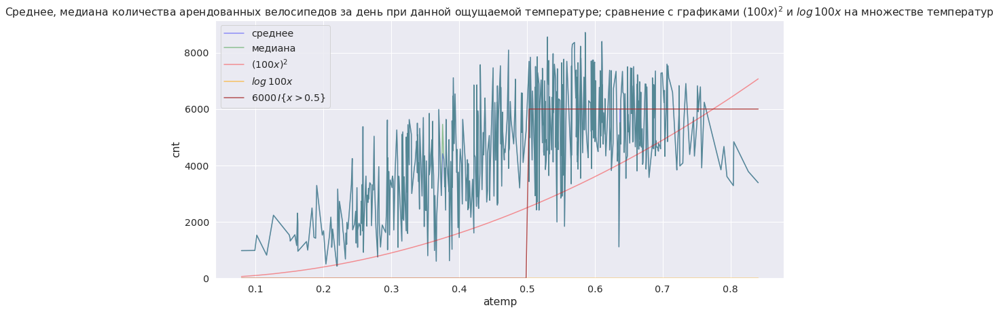

In [ ]:
def indicator(x, c = 0.5):
  if x > c:
    return 1
  else:
    return 0

plt.figure(figsize=(15, 7))
plt.plot(train_redacted.groupby('atemp').mean().index, train_redacted.groupby('atemp').mean()['cnt'], color='blue', label='среднее', alpha=0.4)
plt.plot(train_redacted.groupby('atemp').median().index, train_redacted.groupby('atemp').median()['cnt'], color='green', label='медиана', alpha=0.4)
plt.plot(train_redacted.groupby('atemp').mean().index, pd.Series(train_redacted.groupby('atemp').mean().index).apply(lambda x: (100 * x)**2), color='red', label='$(100x)^2$', alpha=0.4)
plt.plot(train_redacted.groupby('atemp').mean().index, pd.Series(train_redacted.groupby('atemp').mean().index).apply(lambda x: np.log(100 * x)), color='orange', label='$log \, 100x$', alpha=0.6)
plt.plot(train_redacted.groupby('atemp').mean().index, pd.Series(train_redacted.groupby('atemp').mean().index).apply(lambda x: 6000*indicator(x)), color='brown', label='$ 6000 \,I \{ x > 0.5 \} $', alpha=0.8)

plt.title("Среднее, медиана количества арендованных велосипедов за день при данной ощущаемой температуре; сравнение с графиками $(100x)^2$ и $log \, 100x$ на множестве температур ")
plt.ylim(0,)
plt.legend()
plt.xlabel("atemp")
plt.ylabel("cnt")
plt.show()

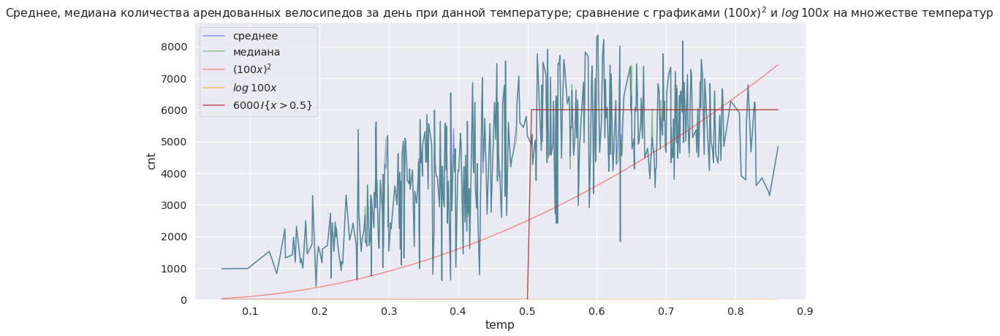

In [ ]:
def indicator(x, c = 0.5):
  if x > c:
    return 1
  else:
    return 0

plt.figure(figsize=(15, 7))
plt.plot(train_redacted.groupby('temp').mean().index, train_redacted.groupby('temp').mean()['cnt'], color='blue', label='среднее', alpha=0.4)
plt.plot(train_redacted.groupby('temp').median().index, train_redacted.groupby('temp').median()['cnt'], color='green', label='медиана', alpha=0.4)
plt.plot(train_redacted.groupby('temp').mean().index, pd.Series(train_redacted.groupby('temp').mean().index).apply(lambda x: (100 * x)**2), color='red', label='$(100x)^2$', alpha=0.4)
plt.plot(train_redacted.groupby('temp').mean().index, pd.Series(train_redacted.groupby('temp').mean().index).apply(lambda x: np.log(100 * x)), color='orange', label='$log \, 100x$', alpha=0.6)
plt.plot(train_redacted.groupby('temp').mean().index, pd.Series(train_redacted.groupby('temp').mean().index).apply(lambda x: 6000*indicator(x)), color='brown', label='$ 6000 \,I \{ x > 0.5 \} $', alpha=0.8)

plt.title("Среднее, медиана количества арендованных велосипедов за день при данной температуре; сравнение с графиками $(100x)^2$ и $log \, 100x$ на множестве температур ")
plt.ylim(0,)
plt.legend()
plt.xlabel("temp")
plt.ylabel("cnt")
plt.show()

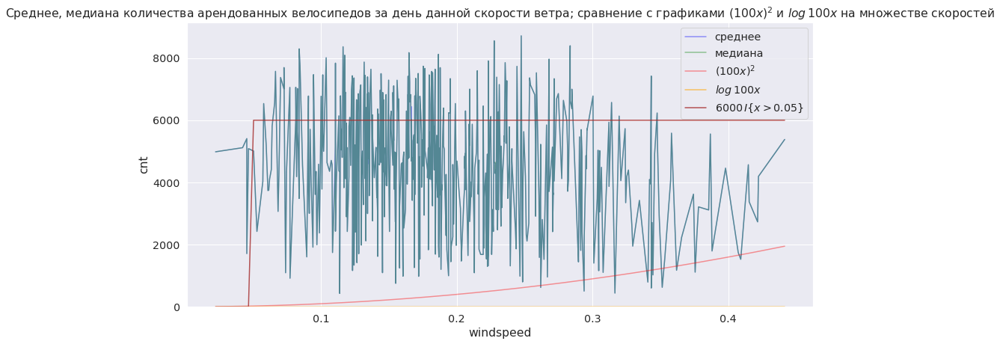

In [ ]:
def indicator(x, c = 0.5):
  if x > c:
    return 1
  else:
    return 0

plt.figure(figsize=(15, 7))
plt.plot(train_redacted.groupby('windspeed').mean().index, train_redacted.groupby('windspeed').mean()['cnt'], color='blue', label='среднее', alpha=0.4)
plt.plot(train_redacted.groupby('windspeed').median().index, train_redacted.groupby('windspeed').median()['cnt'], color='green', label='медиана', alpha=0.4)
plt.plot(train_redacted.groupby('windspeed').mean().index, pd.Series(train_redacted.groupby('windspeed').mean().index).apply(lambda x: (100 * x)**2), color='red', label='$(100x)^2$', alpha=0.4)
plt.plot(train_redacted.groupby('windspeed').mean().index, pd.Series(train_redacted.groupby('windspeed').mean().index).apply(lambda x: np.log(100 * x)), color='orange', label='$log \, 100x$', alpha=0.6)
plt.plot(train_redacted.groupby('windspeed').mean().index, pd.Series(train_redacted.groupby('windspeed').mean().index).apply(lambda x: 6000*indicator(x, 0.05)), color='brown', label='$ 6000 \,I \{ x > 0.05 \} $', alpha=0.8)

plt.title("Среднее, медиана количества арендованных велосипедов за день данной скорости ветра; сравнение с графиками $(100x)^2$ и $log \, 100x$ на множестве скоростей")
plt.ylim(0,)
plt.legend()
plt.xlabel('windspeed')
plt.ylabel("cnt")
plt.show()

**Выводы по графикам:**

*1.Для целевого признака "cnt" прослеживается зависимость от температуры воздуха (реальной и ощущаемой - соотв. признаки temp и atemp). Видно, что с увеличением температуры воздуха до некоторой величины (примерно 0.6) количество арендуемых велосипедов в день возрастает, а после - убывает (см. графики взаимных зависимостей "cnt" и "temp",  "cnt" и "atemp"). Эта же зависимость влияет на распределение точек по месяцам и по временам года (см. графики взаимной зависимости "cnt" и других действительных признаков для всех категориальных признаков).*

*2. В данных присутствуют явные выбросы (см. графики взаимной зависимости cnt от temp).*

*3. Построение перечисленных выше нелинейных функций от вещественных признаков ничего не дало.*

#### 2. Подготовка данных

Опишите по шагам процедуру предобработки данных, которая будет включать работу с выбросами, преобразования вещественных и категориальных признаков, возможно, что-то еще.

**Процедура предобработки данных:**

**1. Удалим выбросы, воспользовавшись quantile.**

**2. Применим OneHotEncoding, чтобы разобраться с категориальными признаками.** 

Реализуйте данную процедуру.

*Удалим выбросы.*

In [ ]:
def clean(data):
    data_cleaned = data.copy()
    data_cleaned = data_cleaned[data_cleaned['cnt'].between(data_cleaned['cnt'].quantile(0.1), data_cleaned['cnt'].quantile(0.9))]
    data_cleaned = data_cleaned.reset_index()
    del data_cleaned['index']
    return data_cleaned

In [ ]:
train_cleaned = clean(train)
train_cleaned

,season,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,cnt
0,4,11,0,2,1,2,0.343333,0.323225,0.662917,0.342046,4094
1,3,9,0,4,1,3,0.633913,0.555361,0.939565,0.192748,1842
2,4,12,0,6,0,1,0.299167,0.310604,0.612917,0.095783,3614
3,3,9,0,0,0,1,0.507500,0.490537,0.695000,0.178483,4274
4,2,5,0,2,1,2,0.561667,0.538529,0.837917,0.277354,4123
...,...,...,...,...,...,...,...,...,...,...,...
461,1,3,0,0,0,1,0.384348,0.380091,0.527391,0.270604,2417
462,2,4,0,0,0,1,0.456667,0.445696,0.479583,0.303496,3744
463,4,9,0,3,1,2,0.635000,0.575158,0.848750,0.148629,3907
464,1,3,0,0,0,1,0.361739,0.359670,0.476957,0.222587,4911


*Применим OneHotEncoding.*

In [ ]:
encoder = OneHotEncoder(drop='first', sparse=False)

#Обучим энкодер на полном трейне, а потом применим к очищенному от выбросов трейну
train_copy = train.copy()
train_copy_cat = encoder.fit_transform(train_copy[categorial_features])

train_cleaned_cat = encoder.transform(train_cleaned[categorial_features])
encoder.categories_

[array([0, 1]),
 array([0, 1]),
 array([1, 2, 3, 4]),
 array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12]),
 array([0, 1, 2, 3, 4, 5, 6]),
 array([1, 2, 3])]

In [ ]:
X_train = np.hstack([train_cleaned[real_features], train_cleaned_cat])
X_train

array([[0.343333, 0.323225, 0.662917, ..., 0.      , 1.      , 0.      ],
       [0.633913, 0.555361, 0.939565, ..., 0.      , 0.      , 1.      ],
       [0.299167, 0.310604, 0.612917, ..., 1.      , 0.      , 0.      ],
       ...,
       [0.635   , 0.575158, 0.84875 , ..., 0.      , 1.      , 0.      ],
       [0.361739, 0.35967 , 0.476957, ..., 0.      , 0.      , 0.      ],
       [0.4125  , 0.417283, 0.819167, ..., 0.      , 1.      , 0.      ]])

In [ ]:
X_train.shape

(466, 28)

#### 3. Обучение модели и ее анализ

Обучите линейную регрессию из `sklearn` на полученных данных и посмотрите на полученные оценки коэффициентов.

In [ ]:

model = LinearRegression(fit_intercept=True)
model.fit(X_train, train_cleaned[target_feature])

LinearRegression()

In [ ]:
model.coef_

array([[ 6938.95985126, -1891.85594791, -2195.65999508, -2668.64042558,
         -300.45342682,    97.15650386,   808.32278859,   951.20328689,
         1370.44899317,  -157.83692954,   189.2082542 ,  -363.76892623,
         -216.46971286,  -930.3477139 , -1358.64818555, -1134.74658276,
         -762.28687658,  -595.04423691,  -608.09101037,  -447.59986845,
          202.87948289,    17.42636187,  -287.94941859,  -162.79790001,
           27.14455089,   183.35461335,  -101.10699503, -1373.01007386]])

In [ ]:
model.intercept_

array([3569.45369248])

Посчитайте ошибку предсказания на тестовой выборке по метрикам RMSE, MAE, MAPE.

*Замечание.* Если в тестовой части тоже есть "большие" выбросы, их стоит убрать. Наша модель не должна пытаться их предсказать, но в то же время выбросы вносят существенный вклад в значение метрики. 

In [ ]:
test_cleaned = clean(test)
test_cleaned_cat = encoder.transform(test_cleaned[categorial_features])

X_test = np.hstack([test_cleaned[real_features], test_cleaned_cat])

In [ ]:
test_preds = model.predict(X_test)

In [ ]:
test_preds

array([[4945.53595599],
       [4161.85601635],
       [4133.75800534],
       [4918.41561035],
       [2883.86172869],
       [5724.65632025],
       [2461.45448029],
       [3297.06415279],
       [4803.18101378],
       [3977.2328839 ],
       [4084.8156802 ],
       [3855.06744168],
       [4230.71460158],
       [5922.05765257],
       [2664.93153068],
       [6500.13584384],
       [4174.53472386],
       [3302.33860027],
       [2549.5607446 ],
       [4670.34118605],
       [3574.71595293],
       [2937.19803202],
       [4628.8247223 ],
       [4292.2739692 ],
       [5018.08708513],
       [4984.44243012],
       [4782.10050073],
       [4756.68776472],
       [4671.39464944],
       [3723.99606198],
       [4890.03464229],
       [3644.55579454],
       [4875.38688859],
       [5408.77977903],
       [5305.58556751],
       [4799.04393   ],
       [5713.34501613],
       [4150.82952982],
       [4745.19158068],
       [3941.20106867],
       [6074.58334327],
       [5241.214

*RMSE:*

In [ ]:
metrics.mean_squared_error(test_cleaned[target_feature], test_preds) ** 0.5

1253.3863445081527

*MAE:*

In [ ]:
metrics.mean_absolute_error(test_cleaned[target_feature], test_preds)

1074.265715979666

*MAPE:*

In [ ]:
metrics.mean_absolute_percentage_error(test_cleaned[target_feature], test_preds)

0.3089932110961935

Попробуйте посчитать оценку коэффициентов с помощью формулы, полученной на занятии. В чем заключается проблема?

*Подсказка.* Подумайте о зависимостях между признаками.

In [ ]:
np.linalg.inv(X_train.transpose() @ X_train) @ X_train.transpose() * train_cleaned['cnt']

ValueError: ignored

*Что-то сломалось. Проверим, вырождена ли матрица $(X_{train}^{T}*X_{train} )$:*

In [ ]:
np.linalg.det(X_train.transpose() @ X_train)

2.9644652111370943e+22

*Не вырождена. Но, может быть, она близка к вырожденной? Вычислим число обусловленности матрицы $(X_{train}^{T}*X_{train} )$:*

In [ ]:
np.linalg.cond(X_train.transpose() @ X_train)

1.8228530772760143e+18

*Матрица $(X_{train}^{T}*X_{train} )$ оказалась близка вырожденной (т.к. у неё очень большое число обусловленности). Это может быть связано с тем, что признаки не являются независимыми. Действительно, если посмотреть на ранее построенные графики (см. PairGrid-ы), можно заметить зависимость между temp и atemp. Кроме того, данные в датасете ненормированны.*

Исправьте эту проблему, посчитайте оценки коэффициентов, а также ошибку предсказания.

*Исключим из рассмотрения признак atemp и повторим ранее проведённые манипуляции с данными в новых условиях.*

In [ ]:
data_without_atemp = data.copy()
del data_without_atemp['atemp']

In [ ]:
train_without_atemp, test_without_atemp = train_test_split(data_without_atemp, train_size=0.8)
train_without_atemp.shape, test_without_atemp.shape

((584, 10), (147, 10))

In [ ]:
train_without_atemp = train_without_atemp.reset_index()
del train_without_atemp['index']

test_without_atemp = test_without_atemp.reset_index()
del test_without_atemp['index']

In [ ]:
real_features_without_atemp = ['temp', 'hum', 'windspeed']

In [ ]:
def clean_without_atemp(data):
    data_cleaned = data.copy()
    data_cleaned = data_cleaned[data_cleaned['cnt'].between(data_cleaned['cnt'].quantile(0.1), data_cleaned['cnt'].quantile(0.9))]
    data_cleaned = data_cleaned.reset_index()
    del data_cleaned['index']
    return data_cleaned

train_cleaned_without_atemp = clean_without_atemp(train_without_atemp)

test_cleaned_without_atemp = clean_without_atemp(test_without_atemp)

In [ ]:
import pandas as pd
from sklearn import preprocessing

buffer_train = train_cleaned_without_atemp[real_features_without_atemp + target_feature].values
min_max_scaler = preprocessing.MinMaxScaler()
buffer_train_scaled = min_max_scaler.fit_transform(buffer_train)
buffer_train_df = pd.DataFrame(buffer_train_scaled, columns=real_features_without_atemp + target_feature)
buffer_train_df

,temp,hum,windspeed,cnt
0,0.546067,0.848027,0.375344,0.421225
1,0.285394,0.334107,0.510372,0.630929
2,0.487641,0.353248,0.397631,0.507360
3,0.740450,0.578886,0.267044,0.920952
4,0.612360,0.872970,0.268535,0.336907
...,...,...,...,...
461,0.679775,0.752320,0.298208,0.604761
462,0.412359,0.278422,0.541524,0.698892
463,0.970786,0.283643,0.409468,0.809377
464,0.325208,0.299858,0.651004,0.558786


In [ ]:
train_cleaned_without_atemp[real_features_without_atemp + target_feature] = buffer_train_df

In [ ]:
train_cleaned_without_atemp

,season,mnth,holiday,weekday,workingday,weathersit,temp,hum,windspeed,cnt
0,2,5,0,5,1,2,0.546067,0.848027,0.375344,0.421225
1,4,11,0,1,1,1,0.285394,0.334107,0.510372,0.630929
2,1,2,0,3,1,1,0.487641,0.353248,0.397631,0.507360
3,2,5,0,3,1,2,0.740450,0.578886,0.267044,0.920952
4,3,9,0,2,1,2,0.612360,0.872970,0.268535,0.336907
...,...,...,...,...,...,...,...,...,...,...
461,2,5,0,2,1,2,0.679775,0.752320,0.298208,0.604761
462,2,4,0,2,1,1,0.412359,0.278422,0.541524,0.698892
463,3,7,0,4,1,1,0.970786,0.283643,0.409468,0.809377
464,2,4,0,3,1,1,0.325208,0.299858,0.651004,0.558786


In [ ]:
train_without_atemp_cleaned_cat = encoder.transform(train_cleaned_without_atemp[categorial_features])

In [ ]:
buffer_test = test_cleaned_without_atemp[real_features_without_atemp + target_feature].values
min_max_scaler_test = preprocessing.MinMaxScaler()
buffer_test_scaled = min_max_scaler_test.fit_transform(buffer_test)
buffer_test_df = pd.DataFrame(buffer_test_scaled, columns=real_features_without_atemp + target_feature)
buffer_test_df

,temp,hum,windspeed,cnt
0,0.357143,0.363057,0.794282,0.599697
1,0.921545,0.313376,0.303555,0.483431
2,0.716627,0.710828,0.418203,0.519409
3,0.366510,0.200637,0.981446,0.533990
4,0.162763,0.252867,0.961233,0.000000
...,...,...,...,...
112,0.285714,0.490447,0.659396,0.710472
113,0.860655,0.550318,0.622245,0.442530
114,0.361827,0.705733,0.500842,0.329104
115,0.042155,0.277707,0.364216,0.140882


In [ ]:
test_cleaned_without_atemp

,season,mnth,holiday,weekday,workingday,weathersit,temp,hum,windspeed,cnt
0,1,3,0,3,1,1,0.404167,0.513333,0.345779,4916
1,3,7,0,0,0,1,0.805833,0.480833,0.164813,4302
2,2,5,0,2,1,2,0.660000,0.740833,0.207092,4492
3,1,3,0,5,1,2,0.410833,0.407083,0.414800,4569
4,1,12,0,6,0,1,0.265833,0.441250,0.407346,1749
...,...,...,...,...,...,...,...,...,...,...
112,4,12,0,2,1,2,0.353333,0.596667,0.296037,5501
113,3,7,0,1,1,1,0.762500,0.635833,0.282337,4086
114,1,2,0,5,1,2,0.407500,0.737500,0.237567,3487
115,1,1,0,6,0,1,0.180000,0.457500,0.187183,2493


In [ ]:
test_cleaned_without_atemp[real_features_without_atemp + target_feature] = buffer_test_df

In [ ]:
test_without_atemp_cleaned_cat = encoder.transform(test_cleaned_without_atemp[categorial_features])

In [ ]:
X_train_without_atemp = np.hstack([train_cleaned_without_atemp[real_features_without_atemp], train_without_atemp_cleaned_cat])
X_train_without_atemp

array([[0.54606717, 0.84802731, 0.37534368, ..., 0.        , 1.        ,
        0.        ],
       [0.28539358, 0.33410688, 0.51037201, ..., 0.        , 0.        ,
        0.        ],
       [0.48764068, 0.35324842, 0.39763052, ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.97078608, 0.28364282, 0.40946816, ..., 0.        , 0.        ,
        0.        ],
       [0.32520794, 0.29985814, 0.65100426, ..., 0.        , 0.        ,
        0.        ],
       [0.85730254, 0.3132252 , 0.29375413, ..., 0.        , 0.        ,
        0.        ]])

*Применим теорему с лекции для подсчёта оценки коэффициентов.*

In [ ]:
np.linalg.cond(X_train_without_atemp.transpose() @ X_train_without_atemp)

9.646920675391455e+17

*Число обусловленности большое, но уже меньше, чем для матрицы $(X_{train}^{T} X_{train} )$*.

In [ ]:
coefs_without_atemp = (np.linalg.inv(X_train_without_atemp.transpose() @ X_train_without_atemp)) @ ((X_train_without_atemp).transpose()) @ train_cleaned_without_atemp['cnt']

In [ ]:
coefs_without_atemp

array([-0.6207245 , -1.3114874 ,  9.06789069, -2.15665714, -1.94021142,
        0.07333273,  0.08028574,  0.16265916,  0.01759171, -0.12033204,
       -0.10972844, -0.24814319, -0.42354935, -0.43077419, -0.42903323,
       -0.28015449, -0.10241327, -0.11500418, -0.17576986,  0.29582489,
       -1.04626048, -0.62908206, -0.58912208, -0.65583724,  0.0715191 ,
       -0.06884741, -0.36362931])

*Сделаем предсказание и посчитаем его ошибку.*

In [ ]:
X_test_without_atemp = np.hstack([test_cleaned_without_atemp[real_features_without_atemp], test_without_atemp_cleaned_cat])

test_preds_without_atemp = X_test_without_atemp @ coefs_without_atemp

test_cleaned_without_atemp

,season,mnth,holiday,weekday,workingday,weathersit,temp,hum,windspeed,cnt
0,1,3,0,3,1,1,0.357143,0.363057,0.794282,0.599697
1,3,7,0,0,0,1,0.921545,0.313376,0.303555,0.483431
2,2,5,0,2,1,2,0.716627,0.710828,0.418203,0.519409
3,1,3,0,5,1,2,0.366510,0.200637,0.981446,0.533990
4,1,12,0,6,0,1,0.162763,0.252867,0.961233,0.000000
...,...,...,...,...,...,...,...,...,...,...
112,4,12,0,2,1,2,0.285714,0.490447,0.659396,0.710472
113,3,7,0,1,1,1,0.860655,0.550318,0.622245,0.442530
114,1,2,0,5,1,2,0.361827,0.705733,0.500842,0.329104
115,1,1,0,6,0,1,0.042155,0.277707,0.364216,0.140882


In [ ]:
test_preds_without_atemp = test_preds_without_atemp.reshape(117, 1)

*RMSE:*

In [ ]:
metrics.mean_squared_error(test_cleaned_without_atemp[target_feature], test_preds_without_atemp) ** 0.5

2.6465312206495994

*MAE:*

In [ ]:

metrics.mean_absolute_error(test_cleaned_without_atemp[target_feature], test_preds_without_atemp)

2.0744558439548832

*Удалим строку с нулём в cnt из обеих колонок (и с предсказанием, и с верными ответами), чтобы корректно посчитать MAPE.*

In [ ]:
test_cleaned_without_atemp.loc[test_cleaned_without_atemp[target_feature[0]] == 0]

,season,mnth,holiday,weekday,workingday,weathersit,temp,hum,windspeed,cnt
4,1,12,0,6,0,1,0.162763,0.252867,0.961233,0.0


In [ ]:
test_cleaned_without_atemp_without_null = test_cleaned_without_atemp.drop(index=[4])
test_cleaned_without_atemp_without_null = test_cleaned_without_atemp_without_null.reset_index()
del test_cleaned_without_atemp_without_null['index']

test_preds_without_atemp_without_null = np.delete(test_preds_without_atemp, 4)

metrics.mean_absolute_percentage_error(test_cleaned_without_atemp_without_null[target_feature], test_preds_without_atemp_without_null)


11.376879233191708

*Одна строка с нулём очень сильно портит MAPE. Удалим эту строку из test и и соответствующую ей строку из train.*

Сделайте выводы.

**Выводы:**

*1. Построение модели с участием зависимых признаков привело к невысокой точности (см. выше подсчёты ошибки) и большим значениям коэффициентов.*

*2. После обработки данных (удаления одного из признаков, который был зависим от другого и нормализации данных по численным признакам) было получено предсказание, которое оказалось точнее по метрикам RMSE и MAE, но хуже по MAPE.*

*Замечание.* Не расстраивайтесь, если у вас получится не очень хорошее качество, это нормально. Вы провели только небольшую предобработку данных и обучили *простую* модель. Более сложные методы обработки данных и обучения ждут вас впереди. Главное &mdash; с чего-то начать!

In [ ]:
train_excel = train.to_excel("train.xlsx")

from google.colab import files

files.download('/content/train.xlsx')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
test_excel = test.to_excel("test.xlsx")

files.download('/content/test.xlsx')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### <font color="orange"><i>Сложная часть</i></font>

### Задача 2.

В данной задаче мы продолжим анализировать данные велопроката из задачи 1.

Для начала реализуйте класс для работы с моделью ridge-регрессии. Интерфейс этого класса соответствует стандарту библиотеки `sklearn`, который использует также множество других библиотек.

In [ ]:
import numpy as np
import pandas as pd

In [ ]:
class RidgeRegression:
    def __init__(self, lambd=0.1, fit_intercept=True):
        self.alpha = lambd
        self.fit_intercept = fit_intercept
        
        
    def fit(self, X, Y):
        '''
        Обучение модели ridge-регрессии.
        
        Аргументы:
        X -- numpy-матрица объект-признак размера (n, d);
        Y -- numpy-вектор значений целевого признака размера (n,).
        '''
        
        # Посчитайте оценки коэффициентов и, возможно, 
        # еще что-то, что пригодится в predict.

        int_flag = int(not self.fit_intercept)

        if not self.fit_intercept:
          X_resh = X.transpose()
          ed = np.array([1] * X.shape[0])
          X_resh = [ed] + X_resh
          X = X_resh.transpose()

        I = np.eye((X.shape)[1] + int_flag)
        self.theta = np.linalg.inv((X.transpose() @ X) + self.alpha * I) @ X.transpose() @ Y

        return self
    
    
    def predict(self, X):
        '''
        Вычисление предсказаний.
        
        Аргументы:
        X -- numpy-матрица объект-признак размера (n, d);
        
        Возвращает:
        predictions -- предсказания в виде numpy-вектора размера (n,).
        '''
        
        # Посчитайте предсказания
        predictions = X @ self.theta 
        
        predictions = np.array(predictions)
        return predictions

Разделите данные на три части &mdash; обучающую, валидационную и тестовую в соотношении 3:1:1. На первой из них вам необходимо проводить всю аналитику и обучать все модели &mdash; регрессию, скалирование и т.д.. Вторую вы будете использовать для выбора оптимального значения гиперпараметра. Наконец, тестовую выборку необходимо использовать только для вычисления итогового значения метрик выбранной модели. Именно эти числа вам нужно говорить заказчику.

In [ ]:
data_shuffled = data.sample(frac=1, random_state=42)
del data_shuffled['atemp']

new_train, validate, new_test =  np.split(data_shuffled, [int(.6*len(data_shuffled)), int(.8*len(data_shuffled))])
new_train.shape, validate.shape, new_test.shape

((438, 10), (146, 10), (147, 10))

In [ ]:
new_train.columns

Index(['season', 'mnth', 'holiday', 'weekday', 'workingday', 'weathersit',
       'temp', 'hum', 'windspeed', 'cnt'],
      dtype='object')

*Как и в прошлый раз, проверим наличие категорий категориальных признаков в new-трейне. При необходимости добавим в new_train небольшое количество строк с недостающими категориями. Это нужно для того, чтобы правильно обучить энкодер.*

In [ ]:
len(new_train['season'].value_counts())

4

In [ ]:
len(new_train['mnth'].value_counts())

12

In [ ]:
len(new_train['holiday'].value_counts())

2

In [ ]:
len(new_train['weekday'].value_counts())

7

In [ ]:
len(new_train['workingday'].value_counts())

2

In [ ]:
len(new_train['weathersit'].value_counts())

3

Выполните необходимые преобразования признаков. Не забудьте, что обучить преобразования нужно только по обучающей выборке. Учтите все особенности, которые обсуждались ранее.

In [ ]:
target_feature = ['cnt']

*Удалим выбросы.*

In [ ]:
new_train_cleaned = clean(new_train)
validate_cleaned = clean(validate)
new_test_cleaned = clean(new_test)

*Между категориальными признаками тоже есть зависимость - между месяцами и сезонами (mnth и season соотв.) (это следует и из здравого смысла, и из графиков попарных зависимостей, где некоторые категориальные признаки принимались за численные). Удалим признак месяца.*

In [ ]:
del new_train_cleaned['mnth']
del validate_cleaned['mnth']
del new_test_cleaned['mnth']

*Энкодим категориальные признаки.*

In [ ]:
categorial_features_without_mnth = ['holiday', 'workingday', 'season', 'weekday', 'weathersit']

In [ ]:
new_encoder = OneHotEncoder(drop='first', sparse=False)

#Обучим new_encoder на полном new-трейне, а потом применим к очищенному от выбросов new-трейну
new_train_copy = new_train.copy()
new_train_copy_cat = new_encoder.fit_transform(new_train_copy[categorial_features_without_mnth])
new_train_cleaned_cat = new_encoder.transform(new_train_cleaned[categorial_features_without_mnth])
new_encoder.categories_


[array([0, 1]),
 array([0, 1]),
 array([1, 2, 3, 4]),
 array([0, 1, 2, 3, 4, 5, 6]),
 array([1, 2, 3])]

In [ ]:
new_test_cleaned_cat = new_encoder.transform(new_test_cleaned[categorial_features_without_mnth])
validate_cleaned_cat = new_encoder.transform(validate_cleaned[categorial_features_without_mnth])

*Сделаем стандартизацию через  StandartScaler.*

In [ ]:
import pandas as pd
from sklearn import preprocessing

buffer_new_train = new_train_cleaned.values
standard_scaler_new_train = preprocessing.StandardScaler()
buffer_new_train_scaled = standard_scaler_new_train.fit_transform(buffer_new_train)
buffer_new_train_df = pd.DataFrame(buffer_new_train_scaled, columns=new_train_cleaned.columns)

In [ ]:
new_test_cleaned_copy = new_test_cleaned.copy()

In [ ]:
new_train_cleaned = buffer_new_train_df

In [ ]:
import pandas as pd
from sklearn import preprocessing

buffer_validate = validate_cleaned.values
standard_scaler_validate = preprocessing.StandardScaler()
buffer_validate_scaled = standard_scaler_validate.fit_transform(buffer_validate)
buffer_validate_df = pd.DataFrame(buffer_validate_scaled, columns=validate_cleaned.columns)

In [ ]:
validate_cleaned_copy = validate_cleaned.copy()

In [ ]:
validate_cleaned = buffer_validate_df

In [ ]:
import pandas as pd
from sklearn import preprocessing

buffer_new_test = new_test_cleaned.values
standard_scaler_new_test = preprocessing.StandardScaler()
buffer_new_test_scaled = standard_scaler_new_test.fit_transform(buffer_new_test)
buffer_new_test_df = pd.DataFrame(buffer_new_test_scaled, columns=new_test_cleaned.columns)

In [ ]:
new_test_cleaned_copy = new_test_cleaned.copy()

In [ ]:
new_test_cleaned = buffer_new_test_df

Определите сетку значений гиперпараметра $\lambda$ и обучите для каждого значения сетки модель ridge-регрессии. Обычно эффективнее брать сетку в логарифмическом масштабе.

In [ ]:
scale = np.logspace(-5, 10, 16)
scale

array([1.e-05, 1.e-04, 1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02,
       1.e+03, 1.e+04, 1.e+05, 1.e+06, 1.e+07, 1.e+08, 1.e+09, 1.e+10])

In [ ]:

X_new_train = np.hstack([new_train_cleaned[real_features_without_atemp], new_train_cleaned_cat])
X_validate = np.hstack([validate_cleaned[real_features_without_atemp], validate_cleaned_cat])
X_new_test = np.hstack([new_test_cleaned[real_features_without_atemp], new_test_cleaned_cat])
X_new_train.shape

(350, 16)

In [ ]:
new_models_validate_preds = np.array([])
new_models_new_train_preds = np.array([])
new_models_thetas = np.array([])
new_models_first_three_thetas = np.array([])

for alpha in scale:
  current_new_model = RidgeRegression(alpha)
  current_new_model.fit(X_new_train, new_train_cleaned['cnt'])

  validate_preds = current_new_model.predict(X_validate)

  new_models_validate_preds = np.append(new_models_validate_preds, validate_preds)

  new_train_preds = current_new_model.predict(X_new_train)
  new_models_new_train_preds = np.append(new_models_new_train_preds, new_train_preds)

  new_models_thetas = np.append(new_models_thetas, current_new_model.theta)
  new_models_first_three_thetas = np.append(new_models_first_three_thetas, np.array(current_new_model.theta[:3]))


In [ ]:
new_models_validate_preds = new_models_validate_preds.reshape(len(scale), len(validate_cleaned['cnt']))
new_models_new_train_preds = new_models_new_train_preds.reshape(len(scale), len(new_train_cleaned['cnt']))
new_models_thetas = new_models_thetas.reshape(len(scale), X_new_train.shape[1])

Для каждой из них посчитайте ошибку по метрикам RMSE, MAE, MAPE по обучающей и валидационной выборкам. 

In [ ]:
validate_RMSE_s = np.array([])
validate_MAE_s = np.array([])
validate_MAPE_s = np.array([])

new_train_RMSE_s = np.array([])
new_train_MAE_s = np.array([])
new_train_MAPE_s = np.array([])

for i in range(len(scale)):
  current_validate_preds = new_models_validate_preds[i]
  current_validate_RMSE = metrics.mean_squared_error(validate_cleaned['cnt'], current_validate_preds) ** 0.5
  current_validate_MAE = metrics.mean_absolute_error(validate_cleaned['cnt'], current_validate_preds)
  current_validate_MAPE = metrics.mean_absolute_percentage_error(validate_cleaned['cnt'], current_validate_preds)
  validate_RMSE_s = np.append(validate_RMSE_s, current_validate_RMSE)
  validate_MAE_s = np.append(validate_MAE_s, current_validate_MAE)
  validate_MAPE_s = np.append(validate_MAPE_s, current_validate_MAPE)

  current_new_train_preds = new_models_new_train_preds[i]
  current_new_train_RMSE = metrics.mean_squared_error(new_train_cleaned['cnt'], current_new_train_preds) ** 0.5
  current_new_train_MAE = metrics.mean_absolute_error(new_train_cleaned['cnt'], current_new_train_preds)
  current_new_train_MAPE = metrics.mean_absolute_percentage_error(new_train_cleaned['cnt'], current_new_train_preds)
  new_train_RMSE_s = np.append(new_train_RMSE_s, current_new_train_RMSE)
  new_train_MAE_s = np.append(new_train_MAE_s, current_new_train_MAE)
  new_train_MAPE_s = np.append(new_train_MAPE_s, current_new_train_MAPE)



In [ ]:
validate_RMSE_s

array([0.85006347, 0.85006325, 0.85006107, 0.85003939, 0.84982911,
       0.84824213, 0.84532555, 0.85886507, 0.93429582, 0.99024288,
       0.99897659, 0.99989716, 0.99998971, 0.99999897, 0.9999999 ,
       0.99999999])

In [ ]:
validate_MAE_s

array([0.70109087, 0.70109075, 0.70108957, 0.70107778, 0.70096279,
       0.70015098, 0.70024973, 0.71556177, 0.76317999, 0.79986453,
       0.80553255, 0.8061189 , 0.80617774, 0.80618362, 0.80618421,
       0.80618427])

In [ ]:
validate_MAPE_s

array([2.14802265, 2.14801746, 2.14796554, 2.14744731, 2.14235537,
       2.099784  , 1.94975197, 1.65636234, 1.09218762, 0.98249985,
       0.99818114, 0.99981739, 0.99998173, 0.99999817, 0.99999982,
       0.99999998])

Для каждой метрики постройте графики зависимости значений метрики от значения гиперпараметра. Сравните поведение значений метрик для обучающей и валидационной выборок.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


([<matplotlib.axis.XTick at 0x7f4c4bd45f10>,
 <a list of 16 Text major ticklabel objects>)

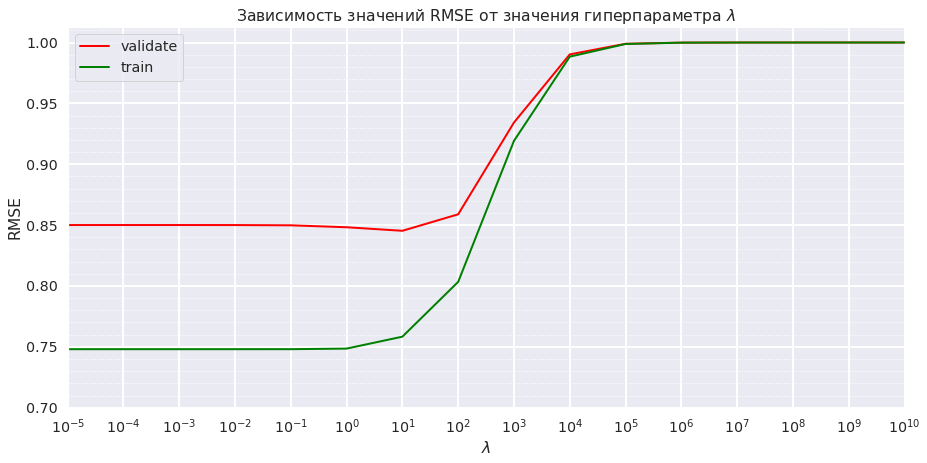

In [ ]:
plt.figure(figsize=(15, 7))
sns.lineplot(scale, validate_RMSE_s, color='red', linewidth=2, label="validate")
sns.lineplot(scale, new_train_RMSE_s, color='green', linewidth=2, label="train")
plt.xscale('log')
plt.legend()
plt.title("Зависимость значений RMSE от значения гиперпараметра $\lambda$")
plt.minorticks_on()
plt.grid(which='minor', linestyle=':', alpha=2)
plt.grid(which='major', linewidth=2, alpha=2)
plt.xlim(min(scale),max(scale))
plt.ylim(0.7,)
plt.xlabel('$\lambda$')
plt.ylabel('RMSE')
plt.xticks(scale)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


([<matplotlib.axis.XTick at 0x7f4c4bc3a790>,
 <a list of 16 Text major ticklabel objects>)

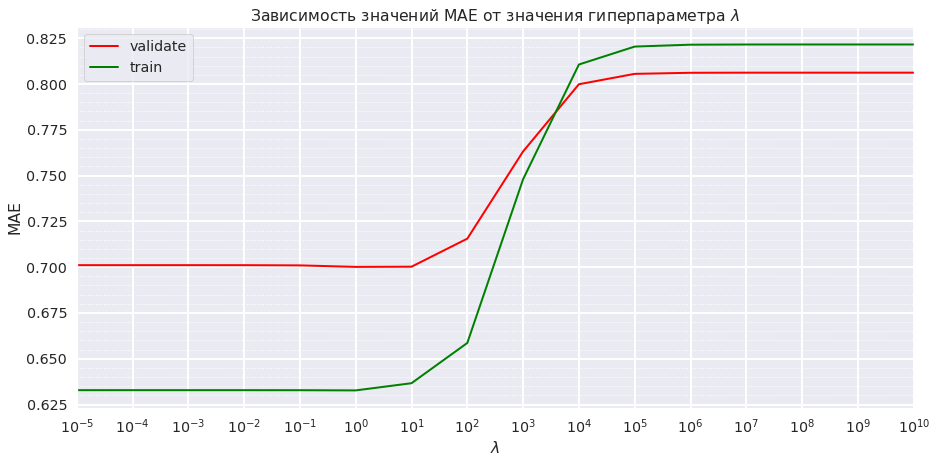

In [ ]:
plt.figure(figsize=(15, 7))
sns.lineplot(scale, validate_MAE_s, color='red', linewidth=2, label="validate")
sns.lineplot(scale, new_train_MAE_s, color='green', linewidth=2, label="train")
plt.xscale('log')
plt.legend()
plt.title("Зависимость значений MAE от значения гиперпараметра $\lambda$")
plt.minorticks_on()
plt.grid(which='minor', linestyle=':', alpha=2)
plt.grid(which='major', linewidth=2, alpha=2)
plt.xlim(min(scale),max(scale))
plt.xlabel('$\lambda$')
plt.ylabel('MAE')
plt.xticks(scale)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


([<matplotlib.axis.XTick at 0x7f4c4c7bcd50>,
 <a list of 16 Text major ticklabel objects>)

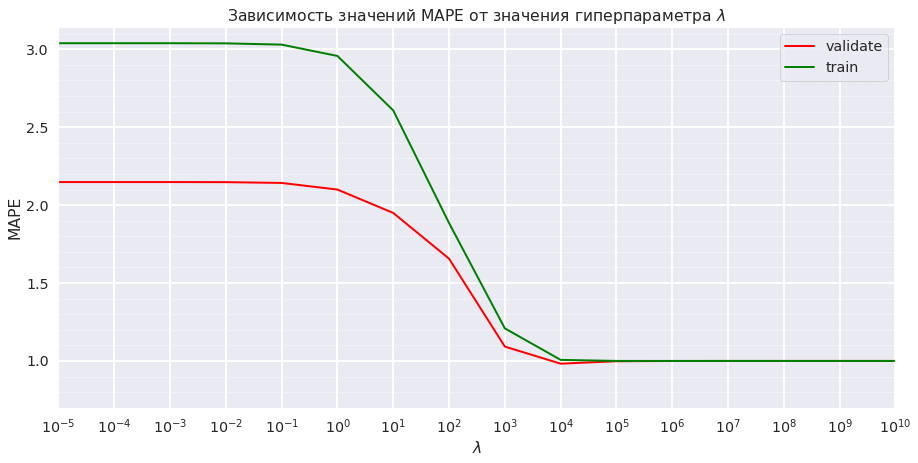

In [ ]:
plt.figure(figsize=(15, 7))
sns.lineplot(scale, validate_MAPE_s, color='red', linewidth=2, label="validate")
sns.lineplot(scale, new_train_MAPE_s, color='green', linewidth=2, label="train")
plt.xscale('log')
plt.legend()
plt.title("Зависимость значений MAPE от значения гиперпараметра $\lambda$")
plt.minorticks_on()
plt.grid(which='minor', linestyle=':', alpha=2)
plt.grid(which='major', linewidth=2, alpha=2)
plt.xlim(min(scale),max(scale))
plt.ylim(0.7,)
plt.xlabel('$\lambda$')
plt.ylabel('MAPE')
plt.xticks(scale)

Постройте также на одном графике кривые зависимости значений оценок коэффициентов от значений гиперпараметра. Какая наблюдается зависимость? Как вы это можете охарактеризовать?

*Замечание*. Для наглядности можно попробовать рисовать одним цветом все кривые, которые относятся к одному *исходному* признаку.

*Видим, что RMSE и MAE мнотононно возрастают с ростом $\lambda$ кроме небольших колебаний в окрестности отрезка [100; 1000]. В то же время, MAE монотонно убывает с ростом $\lambda$, кроме колебаний в окрестности, опять-таки, отрезка [100; 1000]. Видим также, что наиболее значительные изменения значений метрик происходят именно в окрестности вышеупомятого отрезка [100; 1000].*

*Построим графики зависимостей коэффициентов $\Theta$ от $\lambda$.*

In [ ]:
# Посмотрим за оценки коэффициентов для исходных численных признаков
new_models_temp_thetas = new_models_thetas.transpose()[0]
new_models_hum_thetas = new_models_thetas.transpose()[1]
new_models_windspeed_thetas = new_models_thetas.transpose()[2]

#А теперь возьмёмся за категориальные
new_models_first_holiday_thetas = new_models_thetas.transpose()[3]

new_models_first_workingday_thetas = new_models_thetas.transpose()[4]

new_models_first_season_thetas = new_models_thetas.transpose()[5]
new_models_second_season_thetas = new_models_thetas.transpose()[6]
new_models_third_season_thetas = new_models_thetas.transpose()[7]

new_models_first_weekday_thetas = new_models_thetas.transpose()[8]
new_models_second_weekday_thetas = new_models_thetas.transpose()[9]
new_models_third_weekday_thetas = new_models_thetas.transpose()[10]
new_models_fourth_weekday_thetas = new_models_thetas.transpose()[11]
new_models_fiveth_weekday_thetas = new_models_thetas.transpose()[12]
new_models_sixth_weekday_thetas = new_models_thetas.transpose()[13]

new_models_first_weathersit_thetas = new_models_thetas.transpose()[14]
new_models_second_weathersit_thetas = new_models_thetas.transpose()[15]

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-package

([<matplotlib.axis.XTick at 0x7f4c4b8df290>,
 <a list of 16 Text major ticklabel objects>)

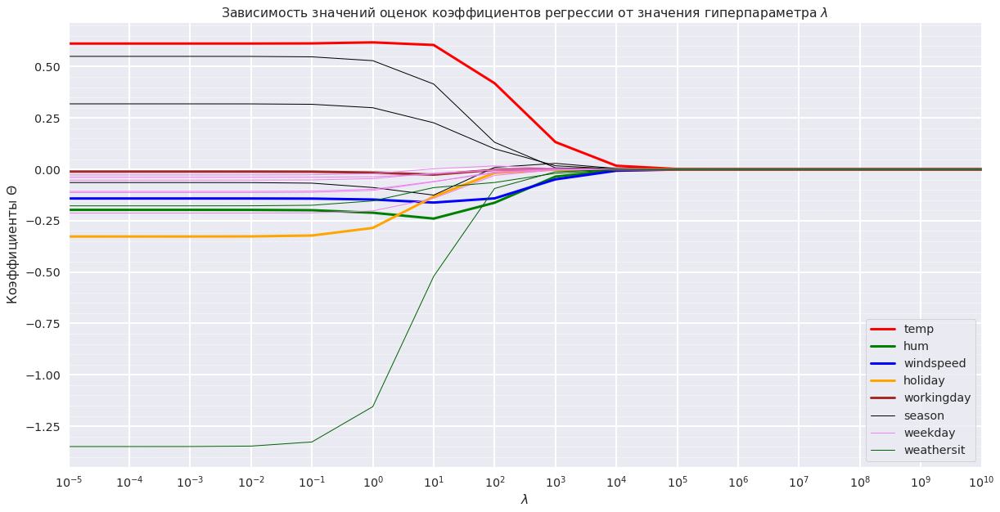

In [ ]:
plt.figure(figsize=(20, 10))

sns.lineplot(scale, new_models_temp_thetas, color='red', linewidth=3, label="temp")
sns.lineplot(scale, new_models_hum_thetas, color='green', linewidth=3, label="hum")
sns.lineplot(scale, new_models_windspeed_thetas, color='blue', linewidth=3, label="windspeed")

sns.lineplot(scale, new_models_first_holiday_thetas, color='orange', linewidth=3, label="holiday")

sns.lineplot(scale, new_models_first_workingday_thetas, color='brown', linewidth=3, label="workingday")

sns.lineplot(scale, new_models_first_season_thetas, color='black', linewidth=1, label="season")
sns.lineplot(scale, new_models_second_season_thetas, color='black', linewidth=1)
sns.lineplot(scale, new_models_third_season_thetas, color='black', linewidth=1)

sns.lineplot(scale, new_models_first_weekday_thetas, color='violet', linewidth=1, label="weekday")
sns.lineplot(scale, new_models_second_weekday_thetas, color='violet', linewidth=1)
sns.lineplot(scale, new_models_third_weekday_thetas, color='violet', linewidth=1)
sns.lineplot(scale, new_models_fourth_weekday_thetas, color='violet', linewidth=1)
sns.lineplot(scale, new_models_fiveth_weekday_thetas, color='violet', linewidth=1)
sns.lineplot(scale, new_models_sixth_weekday_thetas, color='violet', linewidth=1)

sns.lineplot(scale, new_models_first_weathersit_thetas, color='darkgreen', linewidth=1, label="weathersit")
sns.lineplot(scale, new_models_second_weathersit_thetas, color='darkgreen', linewidth=1)

plt.xscale('log')
plt.legend()
plt.title("Зависимость значений оценок коэффициентов регрессии от значения гиперпараметра $\lambda$")
plt.minorticks_on()
plt.grid(which='minor', linestyle=':', alpha=2)
plt.grid(which='major', linewidth=2, alpha=2)
plt.xlim(min(scale),max(scale))
plt.xlabel('$\lambda$')
plt.ylabel('Коэффициенты $\Theta$')
plt.xticks(scale)

*Сузим область определения $\lambda$.*

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-package

([<matplotlib.axis.XTick at 0x7f4c4c8238d0>,
 <a list of 16 Text major ticklabel objects>)

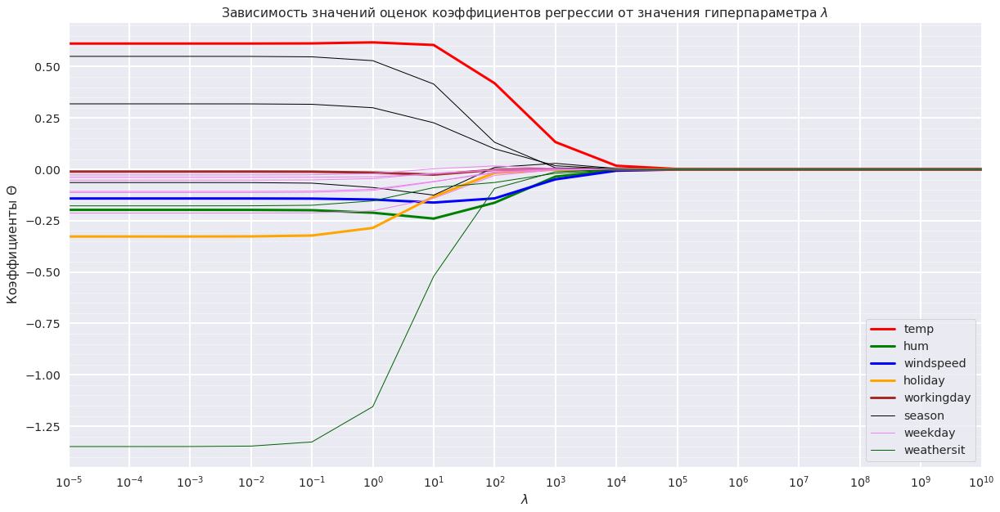

In [ ]:
plt.figure(figsize=(20, 10))

sns.lineplot(scale, new_models_temp_thetas, color='red', linewidth=3, label="temp")
sns.lineplot(scale, new_models_hum_thetas, color='green', linewidth=3, label="hum")
sns.lineplot(scale, new_models_windspeed_thetas, color='blue', linewidth=3, label="windspeed")

sns.lineplot(scale, new_models_first_holiday_thetas, color='orange', linewidth=3, label="holiday")

sns.lineplot(scale, new_models_first_workingday_thetas, color='brown', linewidth=3, label="workingday")

sns.lineplot(scale, new_models_first_season_thetas, color='black', linewidth=1, label="season")
sns.lineplot(scale, new_models_second_season_thetas, color='black', linewidth=1)
sns.lineplot(scale, new_models_third_season_thetas, color='black', linewidth=1)

sns.lineplot(scale, new_models_first_weekday_thetas, color='violet', linewidth=1, label="weekday")
sns.lineplot(scale, new_models_second_weekday_thetas, color='violet', linewidth=1)
sns.lineplot(scale, new_models_third_weekday_thetas, color='violet', linewidth=1)
sns.lineplot(scale, new_models_fourth_weekday_thetas, color='violet', linewidth=1)
sns.lineplot(scale, new_models_fiveth_weekday_thetas, color='violet', linewidth=1)
sns.lineplot(scale, new_models_sixth_weekday_thetas, color='violet', linewidth=1)

sns.lineplot(scale, new_models_first_weathersit_thetas, color='darkgreen', linewidth=1, label="weathersit")
sns.lineplot(scale, new_models_second_weathersit_thetas, color='darkgreen', linewidth=1)

plt.xscale('log')
plt.legend()
plt.title("Зависимость значений оценок коэффициентов регрессии от значения гиперпараметра $\lambda$")
plt.minorticks_on()
plt.grid(which='minor', linestyle=':', alpha=2)
plt.grid(which='major', linewidth=2, alpha=2)
plt.xlim(1/10, 10000)
plt.xlabel('$\lambda$')
plt.ylabel('Коэффициенты $\Theta$')
plt.xticks(scale)

*Наюлюдается в целом уменьшение (с единичными небольшими колебаниями у некоторых коэффициентов) оценок коэффициентов с увеличением $\lambda$ и сходимость к нулю (в $\lambda = 1/10$ или $\lambda = 1$ коэффициенты всех признаков уменьшаются, начиная с $\lambda = 10^4$ все коэффициенты близки к нулю). Это означает, что с ростом $\lambda$ изменения каждого отдельного признака становятся всё менее и менее значительными.*

*В то же время, при малых $\lambda$ тоже не все признаки значительны. Наибольшие оценки коэффициентов (и, как следствие, наибольшую "значимость" для предсказания) имеют признаки weathersit (погода), temp (температура), season (сезон).*

Выберите оптимальное значение гиперпараметра и посчитайте ошибку на тестовой выборке.

*Основываясь на построенных выше графиках, возьмём в качестве оптимального значения $\lambda = 10000$.*

In [ ]:
optimal_lambda = 10000

optimal_new_model = RidgeRegression(optimal_lambda)
optimal_new_model.fit(X_new_train, new_train_cleaned['cnt'])

new_test_preds = optimal_new_model.predict(X_new_test)

*RMSE:*

In [ ]:
new_test_RMSE = metrics.mean_squared_error(new_test_cleaned['cnt'], new_test_preds) ** 0.5
new_test_RMSE

0.9877123711187334

*MAE:*

In [ ]:
new_test_MAE = metrics.mean_absolute_error(new_test_cleaned['cnt'], new_test_preds)
new_test_MAE

0.8242762150071552

*MAPE:*

In [ ]:
new_test_MAPE = metrics.mean_absolute_percentage_error(new_test_cleaned['cnt'], new_test_preds)
new_test_MAPE

1.8178355598724465

Сделайте выводы.

*Эксперимент показал, что Ridge-регрессия со стандартизацией и удалением зависимых признаков с удачно подобранным гиперпараметром показала результат лучше (на всех представленных метриках), чем обычная линейная регрессия (пусть даже со стандартизацией и удалением некоторых зависимых признаков).*